# **Gemma4-Nursing Assessment:Bridging the Gap in Clinical Reasoning with Local On Device AI**



Nurses on the front lines are stretched to their limits, working in a constant whirlwind of activity. It is nearly impossible to maintain perfect clinical judgment under such intense stress. That is why we developed this AI tool—to provide the critical support nurses need, exactly when they need it most.
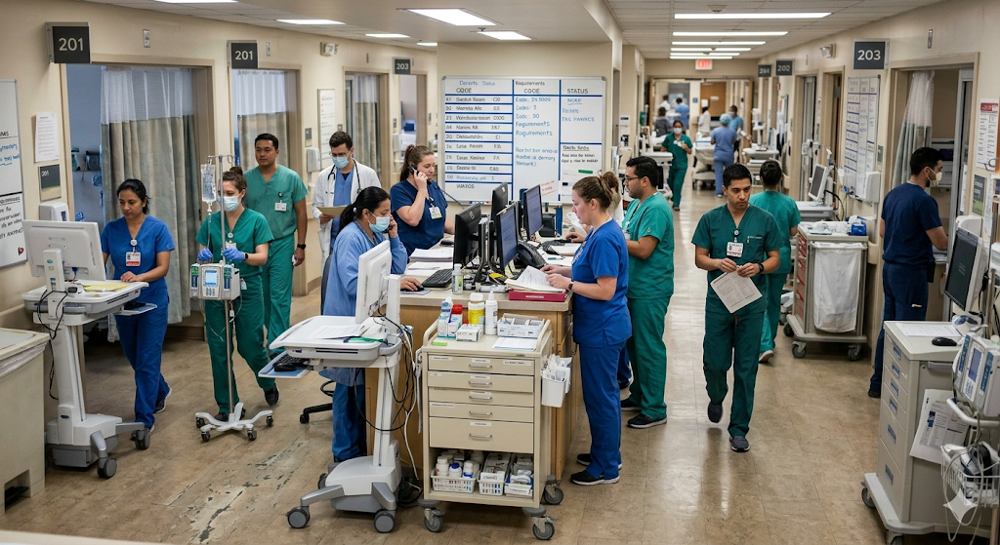
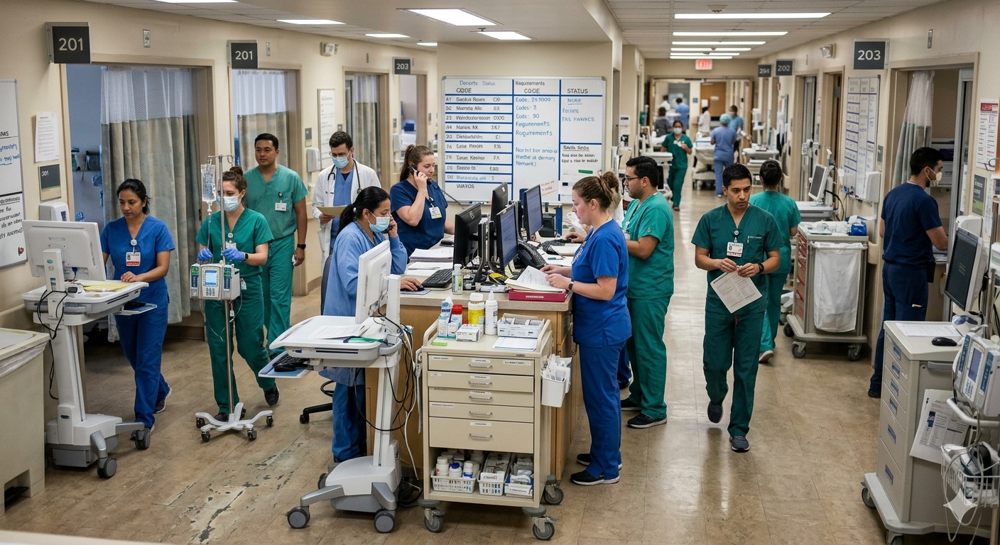
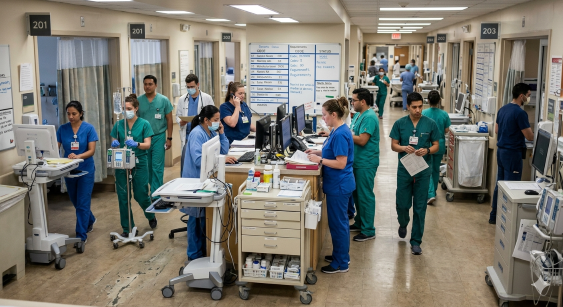
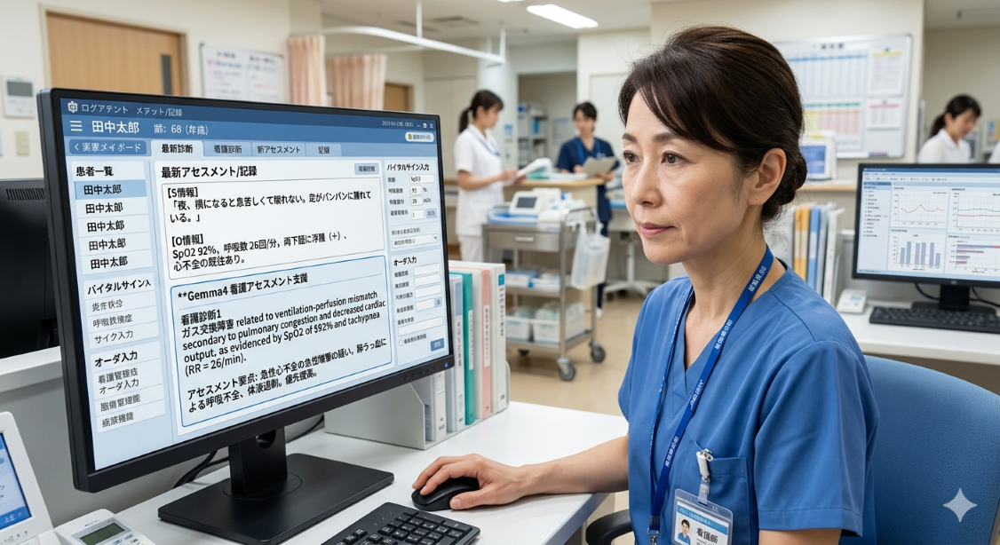
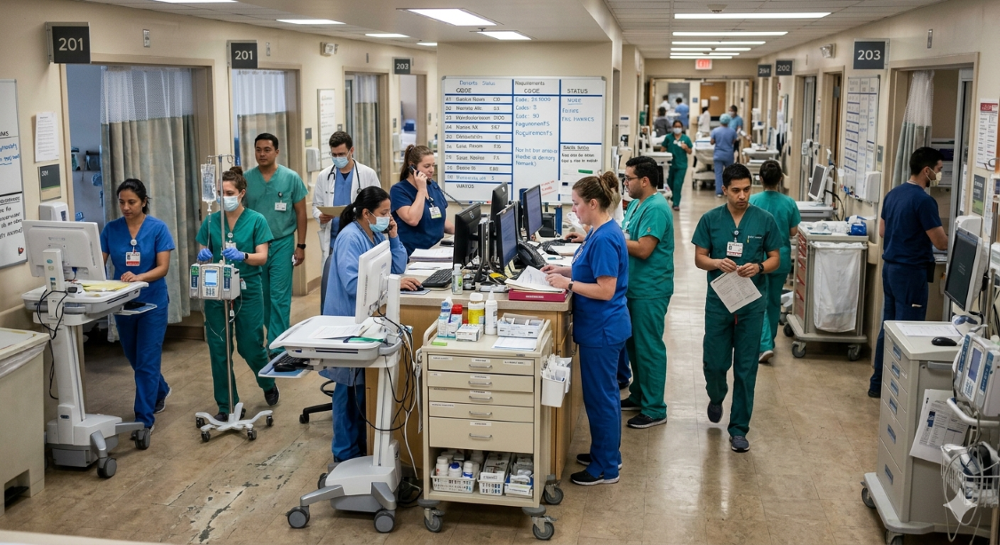
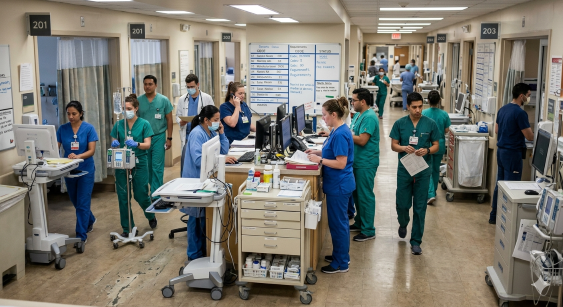
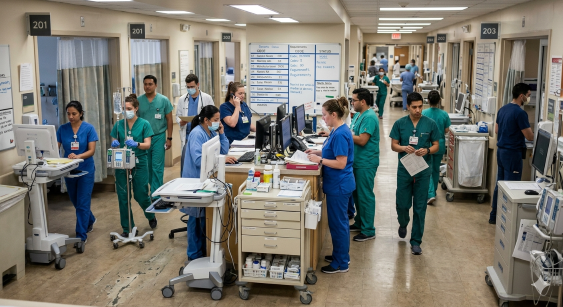
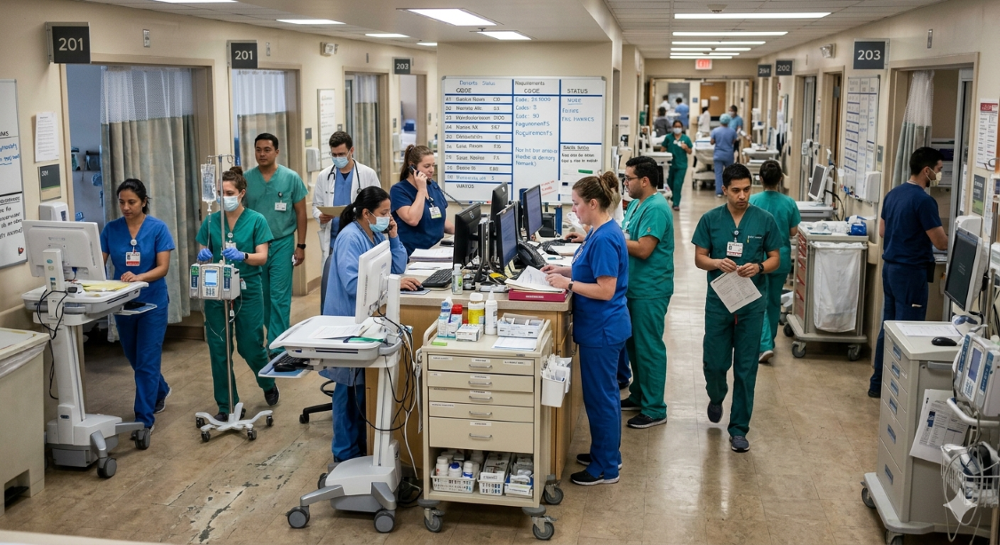
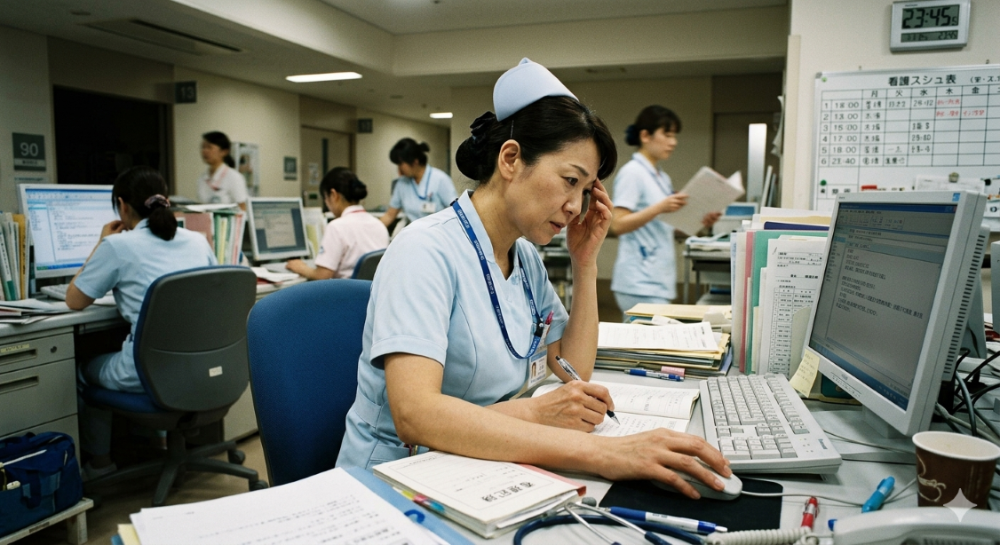

### Step 1: Updating the environment
Updating the required libraries to the latest versions to ensure compatibility with Gemma 4.



In [ ]:
# Upgrade tools to latest
!pip install -q -U transformers accelerate

In [ ]:
import torch
import gc
from transformers import AutoTokenizer, AutoModelForCausalLM
from IPython.display import display, Markdown

# --- 1. Forcefully clear old memory (Crucial: Execute this first) ---
def clear_memory():
    gc.collect()
    torch.cuda.empty_cache()
    if torch.cuda.is_available():
        torch.cuda.synchronize()

clear_memory()

model_path = "/kaggle/input/models/google/gemma-4/transformers/gemma-4-e2b-it/1"

# --- 2. Loading the model (Optimized to skip if already loaded) ---
# This runs immediately after a notebook "Restart"
if 'model' not in locals():
    print("Loading the model...")
    tokenizer = AutoTokenizer.from_pretrained(model_path)
    model = AutoModelForCausalLM.from_pretrained(
        model_path,
        device_map="cuda:0",
        torch_dtype=torch.bfloat16,
        low_cpu_mem_usage=True
    )

# --- 3. Executing the assessment ---
messages = [
    {
        "role": "user",
        "content": """You are an expert nurse and nursing educator with 27 years of experience.
Based on the following patient data, please provide a detailed "Assessment" and "Nursing Diagnosis."

[Constraint]:
- Summarize the assessment concisely.
- Focus deeply on the nursing diagnoses and nursing interventions.
- Output everything in professional medical English.

[Patient Data]:
- Subjective (S): "I can't sleep because it's hard to breathe when I lie down. My legs are swollen and tight."
- Objective (O): SpO2 92%, Respiratory Rate 26/min, Pitting edema in both lower legs (+), History of congestive heart failure.
"""
    }
]

prompt = tokenizer.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)

print("Generating assessment...")
inputs = tokenizer(prompt, return_tensors="pt").to("cuda:0")

with torch.no_grad(): 
    outputs = model.generate(
        **inputs, 
        max_new_tokens=800,      
        repetition_penalty=1.2,
        temperature=0.4,         
        do_sample=True
    )

response = tokenizer.decode(outputs[0], skip_special_tokens=True).split("model\n")[-1]
print("-" * 30)
display(Markdown(response))